

# Домашнее задание
## Тестируем алгоритмы бустинга в бою.


In [3]:
!wget -O WA_Fn-UseC_-Telco-Customer-Churn.csv https://raw.githubusercontent.com/spendmail/otus_machine_learning_professional_hw/master/hw_01/WA_Fn-UseC_-Telco-Customer-Churn.csv

--2024-09-10 09:30:49--  https://raw.githubusercontent.com/spendmail/otus_machine_learning_professional_hw/master/hw_01/WA_Fn-UseC_-Telco-Customer-Churn.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 977501 (955K) [text/plain]
Saving to: ‘WA_Fn-UseC_-Telco-Customer-Churn.csv’

WA_Fn-UseC_-Telco-C 100%[===================>] 954.59K  2.25MB/s    in 0.4s    

2024-09-10 09:30:50 (2.25 MB/s) - ‘WA_Fn-UseC_-Telco-Customer-Churn.csv’ saved [977501/977501]



### Скачиваем датасет telco-customer-churn

### Импортируем необходимые пакеты

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

import warnings

warnings.filterwarnings("ignore")

np.random.seed(123)

### Загружаем данные

In [5]:
data = pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv')

### Анализируем имеющиеся колонки

In [6]:
data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


 - customerID - ID клиента.
 - gender - Пол клиента.
 - SeniorCitizen - Является ли клиент пенсионером.
 - Partner - Семейное положение клиента.
 - Dependents - Есть ли у клиента иждивенцы.
 - tenure - Количество месяцев, в течение которых клиент пользовался подпиской.
 - PhoneService - Есть ли подписка на телефон.
 - MultipleLines - Есть ли подписка на несколько номеров.
 - InternetService - Провайдер интернета.
 - OnlineSecurity - Наличие в подписке услуги онлайн-безопасности.
 - OnlineBackup - Наличие в подписке услуги онлайн-бэкапа.
 - DeviceProtection - Наличие в подписке услуги защиты устройства.
 - TechSupport - Наличие в подписке услуги технической поддержки.
 - StreamingTV - Наличие в подписке услуги стримингового ТВ.
 - StreamingMovies - Наличие в подписке услуги стриминогового кинотеатра.
 - Contract - Тип срока подписки
 - PaperlessBilling - Наличие у клиента только электронных квитанций.
 - PaymentMethod - Тип оплаты.
 - MonthlyCharges - Стоимость подписки в месяц.
 - TotalCharges - Суммарное количество денег, потраченных на подписку.
 - Churn - Продлил ли клиент подписку спустя месяц. Целевая переменная.

### Анализируем пропуски данных

In [7]:
data.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

### В данном датасете пропусков нет
(В противном случае можно удалить строки или проинициализировать пропуски спец. значениями)

In [8]:
# data = data.dropna()
# data.loc[:, 'Age'] = data.Age.fillna(-999)

### Анализируем типы данных

In [9]:
pd.DataFrame(np.array([data.dtypes, data.iloc[0]]), columns=data.columns)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,object,object,int64,object,object,int64,object,object,object,object,...,object,object,object,object,object,object,object,float64,object,object
1,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No


### Колонка TotalCharges с типом object содержит числовые данные, преобразуем тип во float

In [10]:
def try_float(x):
    try:
        return float(x)
    except ValueError:
        return 0


data['TotalCharges'] = data['TotalCharges'].apply(try_float)

temp = pd.DataFrame(np.array([data.dtypes, data.iloc[0]]), columns=data.columns)
temp['TotalCharges']

# Другой способ
# data['TotalCharges'] = np.where(data['tenure'] == 0, 0, data['TotalCharges'])
# data['TotalCharges'] = data['TotalCharges'].astype(float)


0    float64
1      29.85
Name: TotalCharges, dtype: object

### Преобразуем категориальные переменные

### Колонки содержащие yes/no/... значения преобразуем вручную

In [11]:
yes_no_cols = ['Partner', 'Dependents', 'PhoneService', 'MultipleLines',
               'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
               'StreamingTV', 'StreamingMovies', 'PaperlessBilling', 'Churn']

for i in yes_no_cols:
    data[i] = np.where(data[i] == 'Yes', 1, 0)

### Пол и тип подписки преобразуем с помощью LabelEncoder

In [12]:
label_encoder_cols = ['gender', 'Contract']
le = LabelEncoder()

for col in label_encoder_cols:
    data[col] = le.fit_transform(data[col])

### Провайдер и тип оплаты преобразуем с помощью get_dummies

In [13]:
one_hot_encoder_cols = ['InternetService', 'PaymentMethod']

data_dummies = pd.get_dummies(data[one_hot_encoder_cols], prefix=one_hot_encoder_cols, prefix_sep='=')
data = pd.concat([data, data_dummies], axis=1)

# Можно также использовать OneHotEncoding
# from category_encoders import OrdinalEncoder, OneHotEncoder
# enc = OneHotEncoder()
# enc.fit_transform(data[['InternetService', 'PaymentMethod']]).head()

### Удаляем лишние колонки

In [14]:
drop_cols = ['customerID', 'InternetService', 'InternetService=No', 'PaymentMethod']
data = data.drop(drop_cols, axis=1)

### Предпросмотр результата

In [15]:
data.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,InternetService=DSL,InternetService=Fiber optic,PaymentMethod=Bank transfer (automatic),PaymentMethod=Credit card (automatic),PaymentMethod=Electronic check,PaymentMethod=Mailed check
0,0,0,1,0,1,0,0,0,1,0,...,1,29.85,29.85,0,True,False,False,False,True,False
1,1,0,0,0,34,1,0,1,0,1,...,0,56.95,1889.50,0,True,False,False,False,False,True
2,1,0,0,0,2,1,0,1,1,0,...,1,53.85,108.15,1,True,False,False,False,False,True
3,1,0,0,0,45,0,0,1,0,1,...,0,42.30,1840.75,0,True,False,True,False,False,False
4,0,0,0,0,2,1,0,0,0,0,...,1,70.70,151.65,1,False,True,False,False,True,False


In [16]:
data.describe()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,MonthlyCharges,TotalCharges,Churn
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.504756,0.162147,0.483033,0.299588,32.371149,0.903166,0.421837,0.286668,0.344881,0.343888,0.290217,0.384353,0.387903,0.690473,0.592219,64.761692,2279.734304,0.265370
std,0.500013,0.368612,0.499748,0.458110,24.559481,0.295752,0.493888,0.452237,0.475363,0.475038,0.453895,0.486477,0.487307,0.833755,0.491457,30.090047,2266.794470,0.441561
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.250000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,35.500000,398.550000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,29.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,70.350000,1394.550000,0.000000
75%,1.000000,0.000000,1.000000,1.000000,55.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,89.850000,3786.600000,1.000000
max,1.000000,1.000000,1.000000,1.000000,72.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,118.750000,8684.800000,1.000000


In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   gender                                   7043 non-null   int64  
 1   SeniorCitizen                            7043 non-null   int64  
 2   Partner                                  7043 non-null   int64  
 3   Dependents                               7043 non-null   int64  
 4   tenure                                   7043 non-null   int64  
 5   PhoneService                             7043 non-null   int64  
 6   MultipleLines                            7043 non-null   int64  
 7   OnlineSecurity                           7043 non-null   int64  
 8   OnlineBackup                             7043 non-null   int64  
 9   DeviceProtection                         7043 non-null   int64  
 10  TechSupport                              7043 no

### Строим распределение числовых переменных 

In [18]:
# Целевая колонка
y_column = 'Churn'

# Колонки параметров
X_columns = data.columns[data.columns != y_column]

X_columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Contract', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges',
       'InternetService=DSL', 'InternetService=Fiber optic',
       'PaymentMethod=Bank transfer (automatic)',
       'PaymentMethod=Credit card (automatic)',
       'PaymentMethod=Electronic check', 'PaymentMethod=Mailed check'],
      dtype='object')

### Распределение целевой переменной

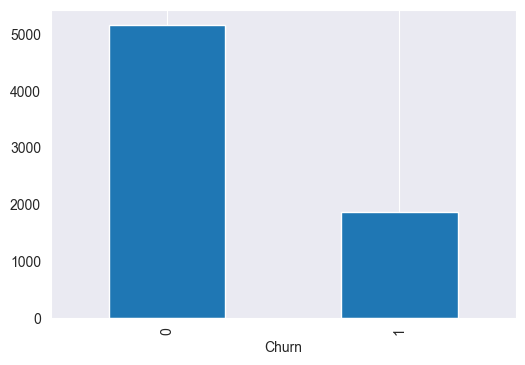

In [19]:
data[y_column].value_counts().plot.bar(figsize=(6, 4))
plt.grid(axis='y')
plt.show()

In [20]:
data[y_column].value_counts(normalize=True)

Churn
0    0.73463
1    0.26537
Name: proportion, dtype: float64

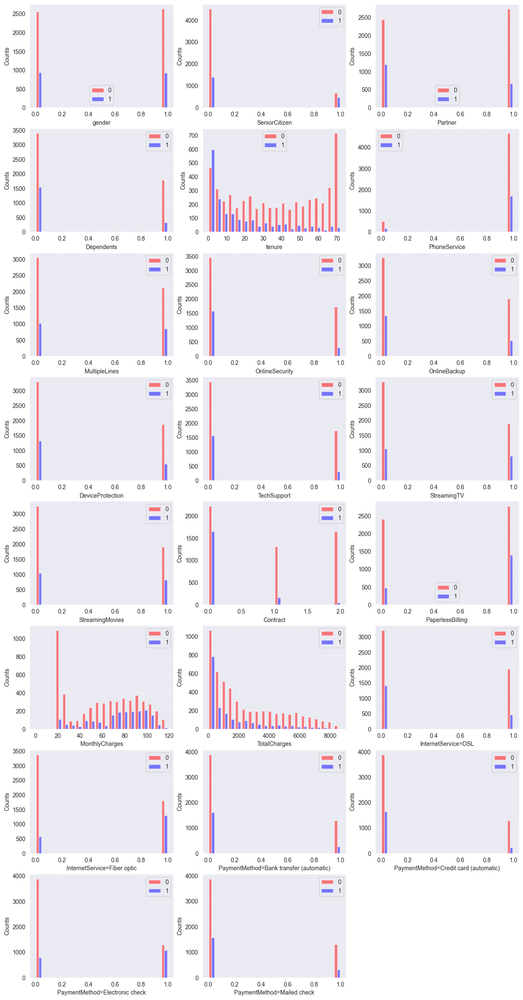

In [21]:
# Define size of the figure
plt.figure(figsize=(15, 30))

# For each column ...
for i_col in range(len(X_columns)):
    # Create subplot for each column
    plt.subplot(8, 3, i_col + 1)

    # Get column and label values
    x_col = data[X_columns[i_col]].values
    y_col = data[y_column].values

    # Calculate bins and bin width
    bins = np.linspace(0, x_col.max(), 21)
    bin_width = bins[1] - bins[0]
    bar_width = bin_width * 0.4  # Bar width as a fraction of bin width

    # Calculate histograms
    hist_0, edges_0 = np.histogram(x_col[y_col == 0], bins=bins)
    hist_1, edges_1 = np.histogram(x_col[y_col == 1], bins=bins)

    # Adjust bin edges for better visibility
    bin_centers_0 = (edges_0[:-1] + edges_0[1:]) / 2 - bar_width / 2
    bin_centers_1 = (edges_1[:-1] + edges_1[1:]) / 2 + bar_width / 2

    # Plot histograms
    plt.bar(bin_centers_0, hist_0, width=bar_width, color='r', alpha=0.5, label='0')
    plt.bar(bin_centers_1, hist_1, width=bar_width, color='b', alpha=0.5, label='1')

    # Labels and legend
    plt.xlabel(X_columns[i_col])
    plt.ylabel('Counts')
    plt.legend(loc='best')

    # Enable grid
    plt.grid(alpha=0.3)

plt.show()

### Или более простой вариант

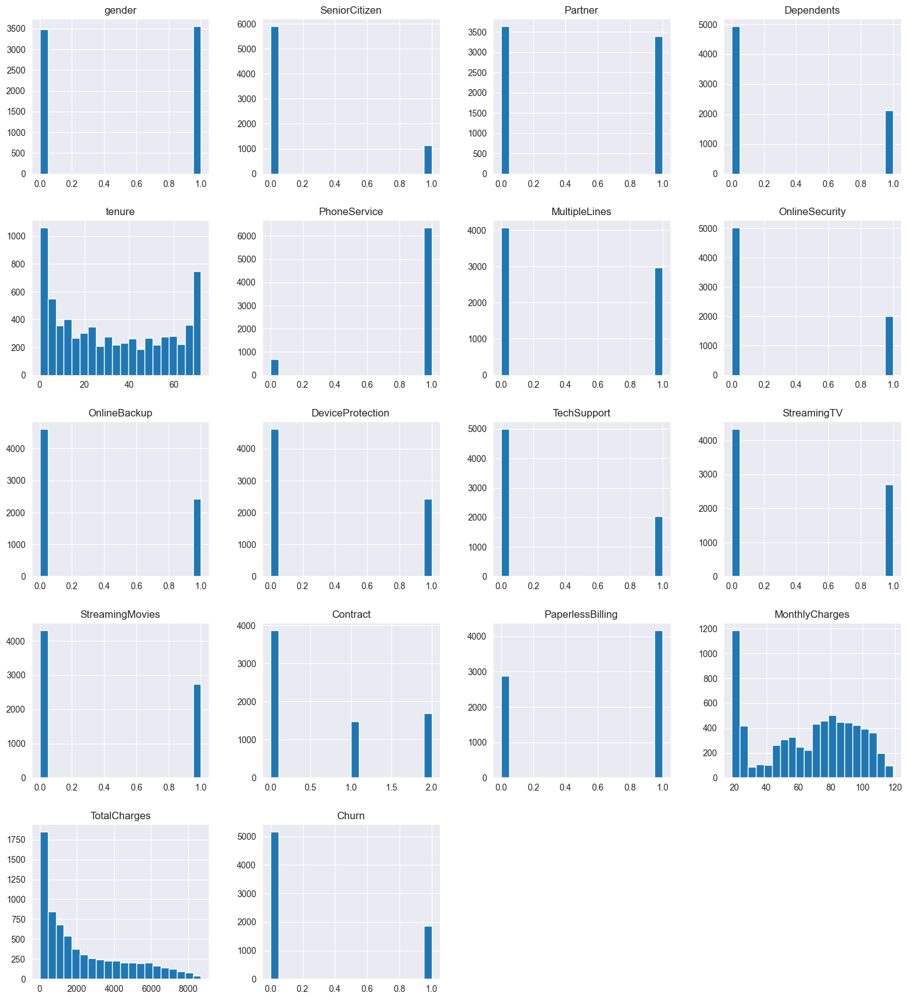

In [22]:
data.hist(figsize=(18, 20), bins=20);

### Карта корреляций

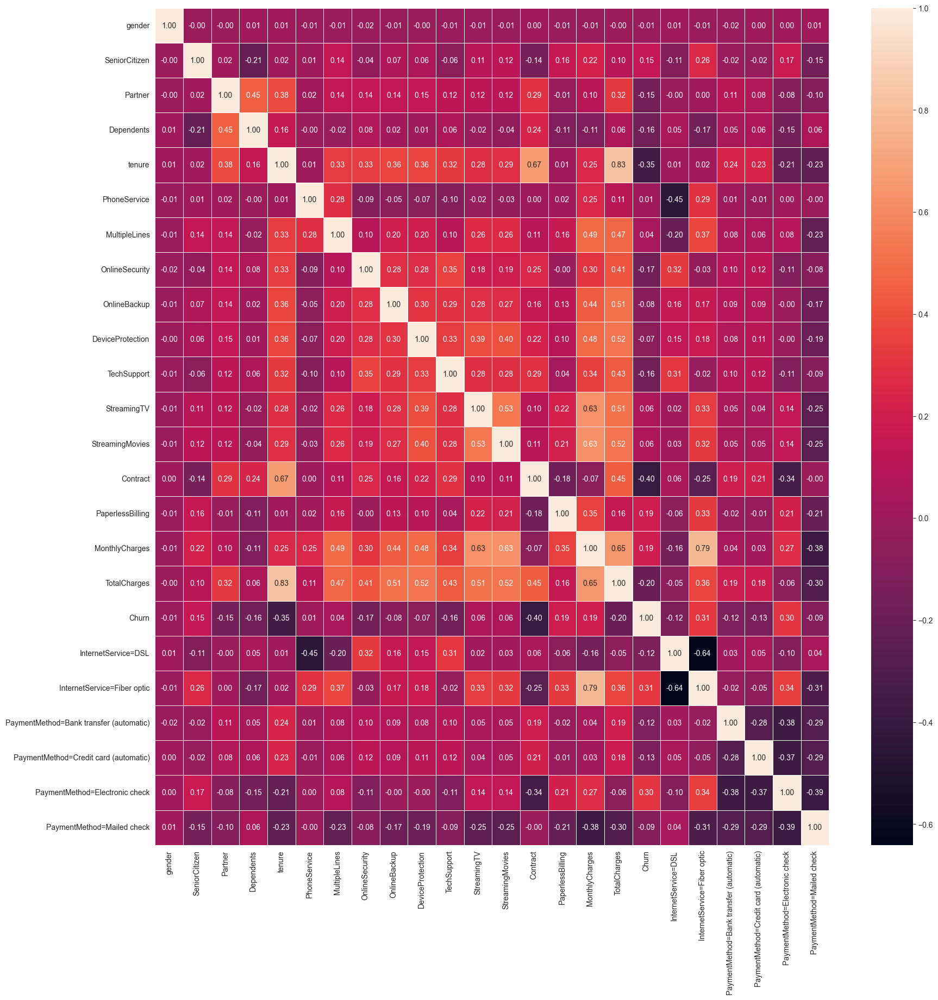

In [23]:
plt.figure(figsize=(20, 20))
sns.heatmap(data.corr(), annot=True, cbar=True, linewidths=.5, fmt='.2f')
plt.show()

### Иногда полезно посмотреть зависимость между двумя параметрами выборочно

In [24]:
# data.plot.scatter(x='gender', y='gender');
# data.plot.scatter(x='MonthlyCharges', y='gender');
# sns.lineplot(y='gender', x='MonthlyCharges', data=data);

### или "все ко всем" 

In [25]:
# %%time
# sns.pairplot(data, height=20);

### Выводы:

### Градиентный бустинг

### Делим наши исходные данные на обучающую (80%) и тестовую (20%) выборки

In [26]:
X = data[X_columns].values
y = data[y_column].values

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=123)

### Функция для сбора основных метрик оценки модели

In [27]:
def quality_report(prediction, prediction_prob, actual, model):
    quality_data = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'f1_score', 'ROC-AUC', 'Gini'],
                                index=[model])

    quality_data['Accuracy'] = round(accuracy_score(prediction, actual), 3)
    quality_data['Precision'] = round(precision_score(prediction, actual), 3)
    quality_data['Recall'] = round(recall_score(prediction, actual), 3)
    quality_data['f1_score'] = round(f1_score(prediction, actual), 3)
    quality_data['ROC-AUC'] = round(roc_auc_score(actual, prediction_prob), 3)
    quality_data['Gini'] = round(2 * roc_auc_score(actual, prediction_prob) - 1, 3)

    return quality_data

### Построим градиетный бустинг на базовых параметрах, используя пакет Sklearn.

In [28]:
from sklearn.ensemble import GradientBoostingClassifier

skgbm = GradientBoostingClassifier()
skgbm.fit(X_train, y_train)
skgbm_pred = skgbm.predict(X_test)
skgbm_pred_prob = skgbm.predict_proba(X_test)[:, 1]

skgbm_report = quality_report(skgbm_pred, skgbm_pred_prob, y_test, 'Sklearn')
skgbm_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Sklearn,0.802,0.52,0.695,0.595,0.85,0.701


### Построим градиетный бустинг на базовых параметрах, используя пакет XGBoost

In [29]:
from xgboost import XGBClassifier

xgbm = XGBClassifier()
xgbm.fit(X_train, y_train)
xgbm_pred = xgbm.predict(X_test)
xgbm_pred_prob = xgbm.predict_proba(X_test)[:, 1]

xgbm_report = quality_report(xgbm_pred, xgbm_pred_prob, y_test, 'XGBoost')
xgbm_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
XGBoost,0.785,0.528,0.64,0.579,0.829,0.657


### Построим градиетный бустинг на базовых параметрах, используя пакет LightGBM.

In [30]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier()
lgbm.fit(X_train, y_train)
lgbm_pred = lgbm.predict(X_test)
lgbm_pred_prob = lgbm.predict_proba(X_test)[:, 1]

lgbm_report = quality_report(lgbm_pred, lgbm_pred_prob, y_test, 'LightGBM')
lgbm_report

[LightGBM] [Info] Number of positive: 1475, number of negative: 4159
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624
[LightGBM] [Info] Number of data points in the train set: 5634, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.261803 -> initscore=-1.036617
[LightGBM] [Info] Start training from score -1.036617


,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
LightGBM,0.799,0.546,0.674,0.603,0.844,0.689


### Построим градиетный бустинг на базовых параметрах, используя пакет CatBoost

In [31]:
from catboost import CatBoostClassifier

catgbm = CatBoostClassifier()
catgbm.fit(X_train, y_train)
catgbm_pred = catgbm.predict(X_test)
catgbm_pred_prob = catgbm.predict_proba(X_test)[:, 1]

catgbm_report = quality_report(catgbm_pred, catgbm_pred_prob, y_test, 'CatBoost')
catgbm_report

Learning rate set to 0.021554
0:	learn: 0.6776720	total: 49.4ms	remaining: 49.3s
1:	learn: 0.6671032	total: 50.3ms	remaining: 25.1s
2:	learn: 0.6539817	total: 52.1ms	remaining: 17.3s
3:	learn: 0.6410241	total: 53.8ms	remaining: 13.4s
4:	learn: 0.6278604	total: 55.4ms	remaining: 11s
5:	learn: 0.6179898	total: 56.7ms	remaining: 9.4s
6:	learn: 0.6068832	total: 58.6ms	remaining: 8.32s
7:	learn: 0.5970000	total: 60.5ms	remaining: 7.5s
8:	learn: 0.5870813	total: 62.1ms	remaining: 6.84s
9:	learn: 0.5787185	total: 63.8ms	remaining: 6.32s
10:	learn: 0.5700926	total: 65.1ms	remaining: 5.85s
11:	learn: 0.5626981	total: 66.3ms	remaining: 5.46s
12:	learn: 0.5550946	total: 68.4ms	remaining: 5.19s
13:	learn: 0.5476831	total: 73.3ms	remaining: 5.16s
14:	learn: 0.5415422	total: 75.2ms	remaining: 4.94s
15:	learn: 0.5347101	total: 76.7ms	remaining: 4.71s
16:	learn: 0.5286642	total: 78.2ms	remaining: 4.52s
17:	learn: 0.5239354	total: 79.4ms	remaining: 4.33s
18:	learn: 0.5191554	total: 80.8ms	remaining: 4.

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
CatBoost,0.806,0.533,0.7,0.605,0.849,0.698


### Метод ближайших соседей

In [32]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=3)

knn.fit(X_train, y_train)
knn_pred = knn.predict(X_test)
knn_pred_prob = knn.predict_proba(X_test)[:, 1]

knn_report = quality_report(knn_pred, knn_pred_prob, y_test, 'KNN')
knn_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
KNN,0.744,0.452,0.551,0.497,0.72,0.44


### Логистическая регрессия

In [33]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(penalty=None)

log_reg.fit(X_train, y_train)
log_reg_pred = log_reg.predict(X_test)
log_reg_pred_prob = log_reg.predict_proba(X_test)[:, 1]

log_reg_report = quality_report(log_reg_pred, log_reg_pred_prob, y_test, 'Log. Reg.')
log_reg_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Log. Reg.,0.806,0.558,0.69,0.617,0.851,0.701


### Дерево принятия решений

In [34]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

des_tree = DecisionTreeClassifier(max_depth=10, min_samples_leaf=1, min_samples_split=2, criterion='gini')

des_tree.fit(X_train, y_train)
des_tree_pred = des_tree.predict(X_test)
des_tree_pred_prob = des_tree.predict_proba(X_test)[:, 1]

des_tree_report = quality_report(des_tree_pred, des_tree_pred_prob, y_test, 'Des. Tree.')
des_tree_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Des. Tree.,0.786,0.551,0.635,0.59,0.759,0.519


### Random Forest

In [35]:
from sklearn.ensemble import RandomForestClassifier

rand_for = RandomForestClassifier(n_estimators=500, n_jobs=-1, max_depth=3, oob_score=True)
# rand_for = RandomForestClassifier(n_estimators=500, n_jobs=-1, max_depth = None, oob_score=True)

rand_for.fit(X_train, y_train)
rand_for_pred = rand_for.predict(X_test)
rand_for_pred_prob = rand_for.predict_proba(X_test)[:, 1]

rand_for_report = quality_report(rand_for_pred, rand_for_pred_prob, y_test, 'Rand. For.')
rand_for_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Rand. For.,0.771,0.289,0.726,0.414,0.845,0.69


### Bagging

In [90]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import BaggingClassifier, BaggingRegressor

bagging = BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=3), n_jobs=-1, n_estimators=100)
# bagging = BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=None), n_jobs=-1, n_estimators=20, oob_score=True)

bagging.fit(X_train, y_train)
bagging_pred = bagging.predict(X_test)
bagging_pred_prob = bagging.predict_proba(X_test)[:, 1]

bagging_report = quality_report(bagging_pred, bagging_pred_prob, y_test, 'Bagging.')
bagging_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Bagging.,0.783,0.393,0.698,0.503,0.829,0.657


### Сравним результаты по всем моделям:

In [91]:
models_report = pd.concat(
    [knn_report, log_reg_report, des_tree_report, rand_for_report, bagging_report, skgbm_report, xgbm_report,
     lgbm_report, catgbm_report])
models_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
KNN,0.744,0.452,0.551,0.497,0.720,0.440
Log. Reg.,0.806,0.558,0.690,0.617,0.851,0.701
Des. Tree.,0.786,0.551,0.635,0.590,0.759,0.519
Rand. For.,0.771,0.289,0.726,0.414,0.845,0.690
Bagging.,0.783,0.393,0.698,0.503,0.829,0.657
Sklearn,0.802,0.520,0.695,0.595,0.850,0.701
XGBoost,0.785,0.528,0.640,0.579,0.829,0.657
LightGBM,0.799,0.546,0.674,0.603,0.844,0.689
CatBoost,0.806,0.533,0.700,0.605,0.849,0.698


### Выводы:

### Кроссвалидация и GridSearch

In [38]:
gb_parameters = {'max_depth': np.array(range(3, 10)),
                 'learning_rate': [0.001, 0.01, 0.02, 0.03, 0.04, 0.1, 0.2, 0.3],
                 'n_estimators': np.array(range(20, 120, 20))}

Sklearn

In [39]:
%%time
skgbm_gs = GridSearchCV(skgbm,
                        gb_parameters,
                        scoring='recall',
                        cv=5)

skgbm_gs.fit(X_train, y_train)
skgbm_gs.best_params_

CPU times: user 14min 41s, sys: 47 ms, total: 14min 41s
Wall time: 14min 42s


{'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 60}

In [40]:
skgbm_gs_pred = skgbm_gs.predict(X_test)
skgbm_gs_pred_prob = skgbm_gs.predict_proba(X_test)[:, 1]

skgbm_gs_report = quality_report(skgbm_gs_pred, skgbm_gs_pred_prob, y_test, 'Sklearn - GridSearch')
skgbm_gs_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Sklearn - GridSearch,0.781,0.52,0.631,0.57,0.842,0.685


XGBoost

In [41]:
%%time
xgbm_gs = GridSearchCV(xgbm,
                       gb_parameters,
                       scoring='recall',
                       cv=5)

xgbm_gs.fit(X_train, y_train)
xgbm_gs.best_params_

CPU times: user 10min 12s, sys: 1.99 s, total: 10min 14s
Wall time: 1min 21s


{'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 40}

In [42]:
xgbm_gs_pred = xgbm_gs.predict(X_test)
xgbm_gs_pred_prob = xgbm_gs.predict_proba(X_test)[:, 1]

xgbm_gs_report = quality_report(xgbm_gs_pred, xgbm_gs_pred_prob, y_test, 'XGBoost - GridSearch')
xgbm_gs_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
XGBoost - GridSearch,0.806,0.541,0.698,0.609,0.85,0.699


LightGBM

In [43]:
%%time
lgbm_gs = GridSearchCV(lgbm,
                       gb_parameters,
                       scoring='recall',
                       cv=5)

lgbm_gs.fit(X_train, y_train)
lgbm_gs.best_params_

[LightGBM] [Info] Number of positive: 1180, number of negative: 3327
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 624
[LightGBM] [Info] Number of data points in the train set: 4507, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.261815 -> initscore=-1.036557
[LightGBM] [Info] Start training from score -1.036557
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 80}

In [44]:
lgbm_gs_pred = lgbm_gs.predict(X_test)
lgbm_gs_pred_prob = lgbm_gs.predict_proba(X_test)[:, 1]

lgbm_gs_report = quality_report(lgbm_gs_pred, lgbm_gs_pred_prob, y_test, 'LightGBM - GridSearch')
lgbm_gs_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
LightGBM - GridSearch,0.799,0.528,0.682,0.595,0.85,0.7


CatBoost

In [45]:
%%time
catgbm_gs = GridSearchCV(catgbm,
                         gb_parameters,
                         scoring='recall',
                         cv=5)

catgbm_gs.fit(X_train, y_train)
catgbm_gs.best_params_

0:	learn: 0.6924988	total: 1.07ms	remaining: 20.4ms
1:	learn: 0.6918293	total: 2.07ms	remaining: 18.7ms
2:	learn: 0.6911698	total: 2.9ms	remaining: 16.4ms
3:	learn: 0.6905484	total: 3.76ms	remaining: 15.1ms
4:	learn: 0.6898840	total: 4.63ms	remaining: 13.9ms
5:	learn: 0.6892433	total: 5.47ms	remaining: 12.8ms
6:	learn: 0.6885858	total: 6.34ms	remaining: 11.8ms
7:	learn: 0.6879234	total: 7.43ms	remaining: 11.1ms
8:	learn: 0.6872672	total: 8.37ms	remaining: 10.2ms
9:	learn: 0.6866132	total: 9.33ms	remaining: 9.33ms
10:	learn: 0.6860227	total: 10.2ms	remaining: 8.37ms
11:	learn: 0.6854180	total: 11.1ms	remaining: 7.42ms
12:	learn: 0.6847590	total: 12.2ms	remaining: 6.55ms
13:	learn: 0.6841358	total: 13.1ms	remaining: 5.61ms
14:	learn: 0.6835360	total: 13.9ms	remaining: 4.64ms
15:	learn: 0.6829449	total: 14.8ms	remaining: 3.69ms
16:	learn: 0.6823274	total: 15.6ms	remaining: 2.75ms
17:	learn: 0.6817010	total: 16.4ms	remaining: 1.83ms
18:	learn: 0.6811260	total: 17.3ms	remaining: 910us
19:	l

{'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 60}

In [46]:
catgbm_gs_pred = catgbm_gs.predict(X_test)
catgbm_gs_pred_prob = catgbm_gs.predict_proba(X_test)[:, 1]

catgbm_gs_report = quality_report(catgbm_gs_pred, catgbm_gs_pred_prob, y_test, 'CatBoost - GridSearch')
catgbm_gs_report


,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
CatBoost - GridSearch,0.81,0.543,0.709,0.615,0.853,0.705


knn

In [55]:
knn_parameters = {
    'n_neighbors': range(1, 50),
    'weights': ['uniform', 'distance']
}

In [56]:
%%time
knn_gs = GridSearchCV(knn,
                      knn_parameters,
                      scoring='recall',
                      cv=5)

knn_gs.fit(X_train, y_train)
knn_gs.best_params_

CPU times: user 1min 11s, sys: 47.4 ms, total: 1min 11s
Wall time: 24 s


{'n_neighbors': 1, 'weights': 'uniform'}

In [57]:
knn_gs_pred = knn_gs.predict(X_test)
knn_gs_pred_prob = knn_gs.predict_proba(X_test)[:, 1]

knn_gs_report = quality_report(knn_gs_pred, knn_gs_pred_prob, y_test, 'KNN - GridSearch')
knn_gs_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
KNN - GridSearch,0.724,0.51,0.506,0.508,0.659,0.317


Логистическая регрессия

In [81]:
log_reg_parameters = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

In [82]:
%%time
log_reg_gs = GridSearchCV(log_reg,
                          log_reg_parameters,
                          scoring='recall',
                          cv=5)

log_reg_gs.fit(X_train, y_train)
log_reg_gs.best_params_

CPU times: user 3.55 s, sys: 5.84 s, total: 9.4 s
Wall time: 2.63 s


{'C': 0.01}

In [83]:
log_reg_gs_pred = log_reg_gs.predict(X_test)
log_reg_gs_pred_prob = log_reg_gs.predict_proba(X_test)[:, 1]

log_reg_gs_report = quality_report(log_reg_gs_pred, log_reg_gs_pred_prob, y_test, 'Log. Reg. - GridSearch')
log_reg_gs_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Log. Reg. - GridSearch,0.78,0.508,0.633,0.563,0.826,0.652


Дерево принятия решений

In [77]:
des_tree_parameters = {'max_depth': [1, 3, 5, 7, 10, None],
                       'min_samples_split': [2, 5, 10, 20],
                       'min_samples_leaf': [1, 5, 10, 50]}

In [78]:
%%time
des_tree_gs = GridSearchCV(des_tree,
                           des_tree_parameters,
                           scoring='recall',
                           cv=5)

des_tree_gs.fit(X_train, y_train)
des_tree_gs.best_params_

CPU times: user 7.62 s, sys: 0 ns, total: 7.62 s
Wall time: 7.69 s


{'max_depth': 5, 'min_samples_leaf': 5, 'min_samples_split': 2}

In [79]:
des_tree_gs_pred = des_tree_gs.predict(X_test)
des_tree_gs_pred_prob = des_tree_gs.predict_proba(X_test)[:, 1]

des_tree_gs_report = quality_report(des_tree_gs_pred, des_tree_gs_pred_prob, y_test, 'Des. Tree. - GridSearch')
des_tree_gs_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Des. Tree. - GridSearch,0.791,0.609,0.632,0.62,0.841,0.681


Random Forest

In [84]:
rand_for_parameters = {'n_estimators': [5, 10, 50, 100, 500], 'max_features': [None, 3], 'max_depth': [None, 3, 5, 10]}

In [85]:
%%time
rand_for_gs = GridSearchCV(rand_for,
                           rand_for_parameters,
                           scoring='recall',
                           cv=5)

rand_for_gs.fit(X_train, y_train)
rand_for_gs.best_params_

CPU times: user 3min 25s, sys: 4.24 s, total: 3min 30s
Wall time: 1min 14s


{'max_depth': None, 'max_features': None, 'n_estimators': 5}

In [86]:
rand_for_gs_pred = rand_for_gs.predict(X_test)
rand_for_gs_pred_prob = rand_for_gs.predict_proba(X_test)[:, 1]

rand_for_gs_report = quality_report(rand_for_gs_pred, rand_for_gs_pred_prob, y_test, 'Rand. Forest. - GridSearch')
rand_for_gs_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Rand. Forest. - GridSearch,0.766,0.52,0.592,0.554,0.787,0.573


Результаты

In [69]:
def get_model_params(model_params, model_name):
    params_data = pd.DataFrame(columns=['learning_rate', 'max_depth', 'n_estimators'], index=[model_name])
    params_data['learning_rate'] = model_params['learning_rate']
    params_data['max_depth'] = model_params['max_depth']
    params_data['n_estimators'] = model_params['n_estimators']

    return params_data

In [70]:
params_report = pd.concat([
    get_model_params(skgbm_gs.best_params_, 'Sklearn'),
    get_model_params(xgbm_gs.best_params_, 'XGBoost'),
    get_model_params(lgbm_gs.best_params_, 'LightGBM'),
    get_model_params(catgbm_gs.best_params_, 'CatBoost'),
])

params_report

,learning_rate,max_depth,n_estimators
Sklearn,0.2,5,60
XGBoost,0.2,4,40
LightGBM,0.1,5,80
CatBoost,0.2,4,60


In [97]:
models_report = pd.concat([
    skgbm_report, skgbm_gs_report,
    xgbm_report, xgbm_gs_report,
    lgbm_report, lgbm_gs_report,
    catgbm_report, catgbm_gs_report,
    knn_report, knn_gs_report,
    log_reg_report, log_reg_gs_report,
    des_tree_report, des_tree_gs_report,
    rand_for_report, rand_for_gs_report,
    bagging_report
])

models_report

,Accuracy,Precision,Recall,f1_score,ROC-AUC,Gini
Sklearn,0.802,0.520,0.695,0.595,0.850,0.701
Sklearn - GridSearch,0.781,0.520,0.631,0.570,0.842,0.685
XGBoost,0.785,0.528,0.640,0.579,0.829,0.657
XGBoost - GridSearch,0.806,0.541,0.698,0.609,0.850,0.699
LightGBM,0.799,0.546,0.674,0.603,0.844,0.689
LightGBM - GridSearch,0.799,0.528,0.682,0.595,0.850,0.700
CatBoost,0.806,0.533,0.700,0.605,0.849,0.698
CatBoost - GridSearch,0.810,0.543,0.709,0.615,0.853,0.705
KNN,0.744,0.452,0.551,0.497,0.720,0.440
KNN - GridSearch,0.724,0.510,0.506,0.508,0.659,0.317
